In [36]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [37]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
# plotly for more interactive visualisation
import plotly
import plotly.graph_objs as go

from create_dataset import DATASET_HDF

In [38]:
with h5py.File(DATASET_HDF, 'r') as hdf:
    categories = list(hdf.keys())
    
    models = []
    for c in categories:
        dataset = np.random.choice(list(hdf[c].keys()))
        models.append(np.array(hdf[c][dataset]))

In [39]:
def plot_matplotlib(data, threshold=1.0):
    x, y, z = np.indices((32, 32, 32))

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.voxels(data >= threshold, facecolor='blue', edgecolor='k')
    plt.show()

In [40]:
# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

def plot_plotly(data):
    x,y,z = np.where(data == 1)

    scatter = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker={
            'symbol': 'square',
            'line': {'width':2, 'color':'DarkSlateGrey'},
            'size': 10,
            'opacity': 1.0,
        }
    )

    # Configure the layout.
    layout = go.Layout(
        margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
    )

    plot_figure = go.Figure(data=[scatter], layout=layout)
    plotly.offline.iplot(plot_figure)

airplane


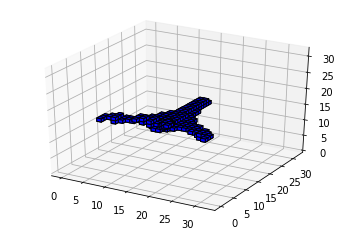

bathtub


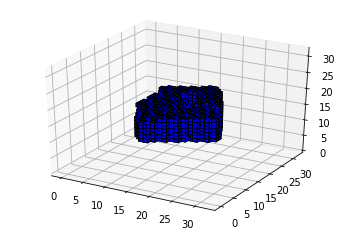

bed


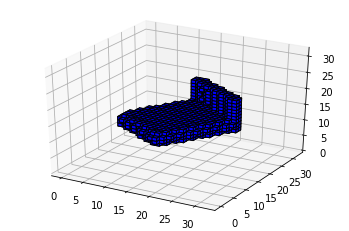

bench


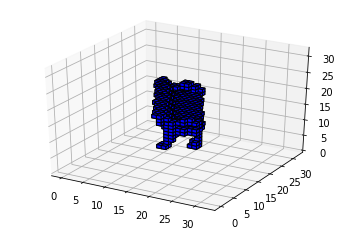

bookshelf


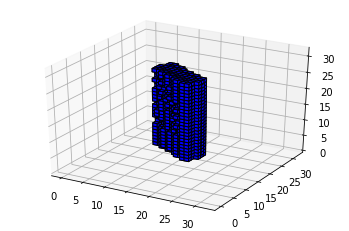

bottle


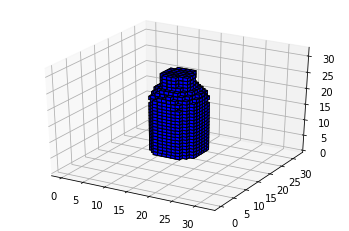

bowl


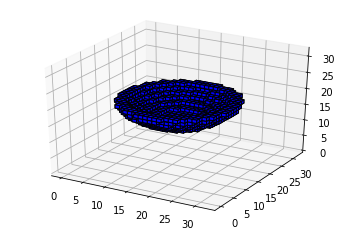

car


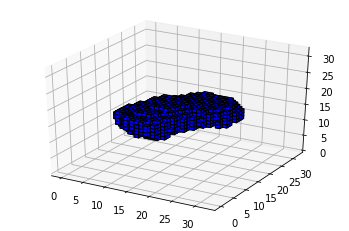

chair


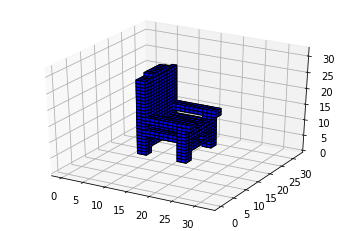

cone


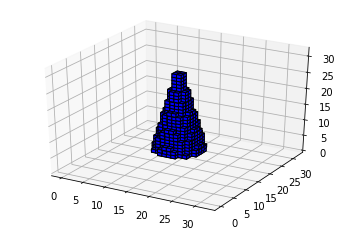

cup


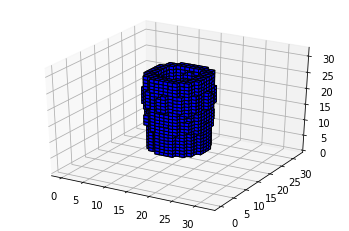

curtain


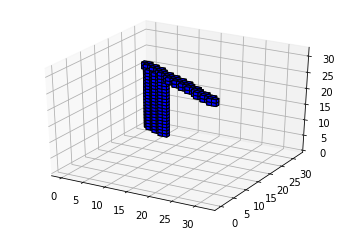

desk


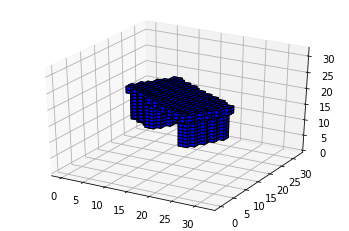

door


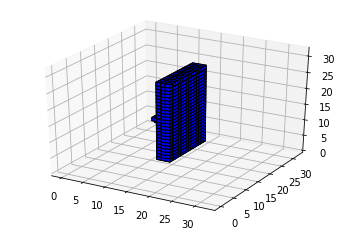

dresser


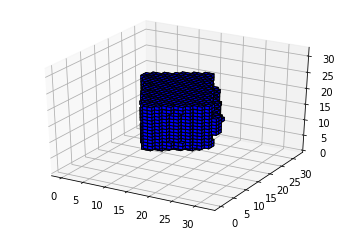

flower_pot


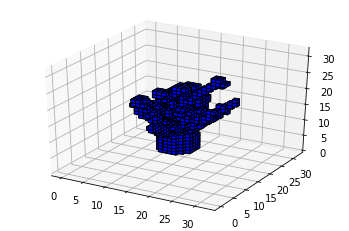

glass_box


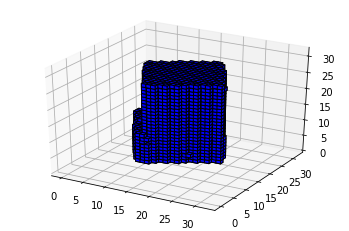

guitar


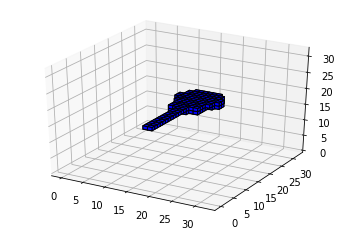

keyboard


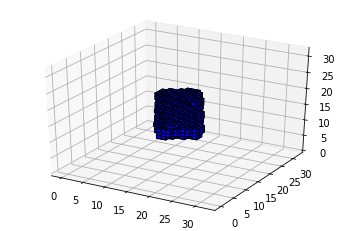

lamp


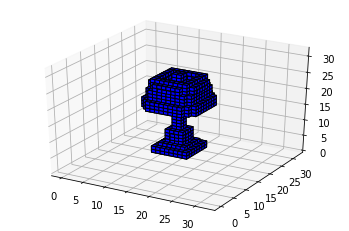

laptop


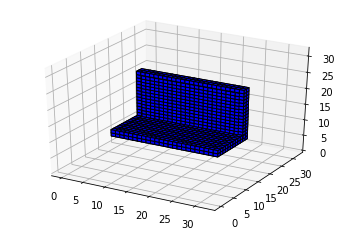

mantel


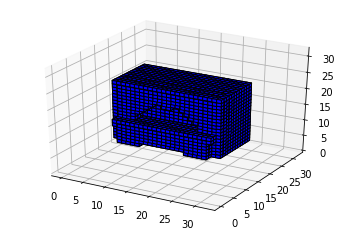

monitor


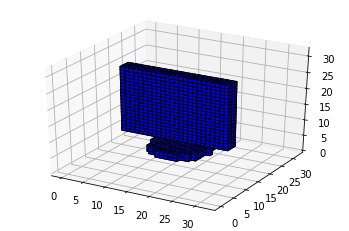

night_stand


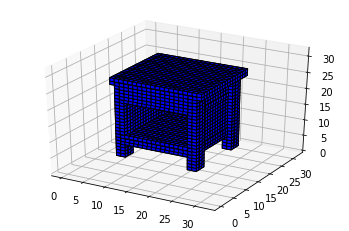

person


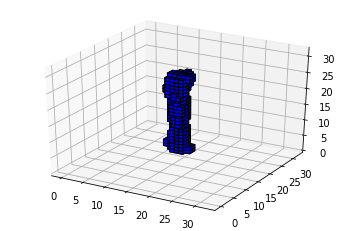

piano


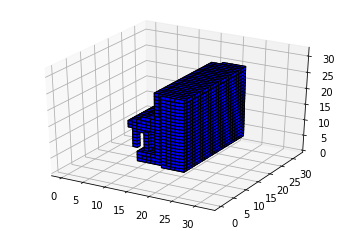

plant


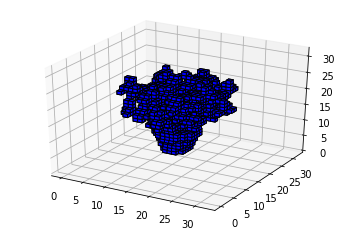

radio


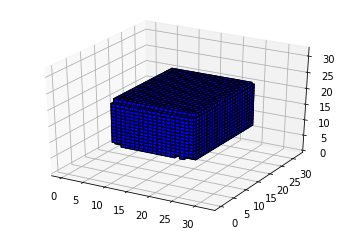

range_hood


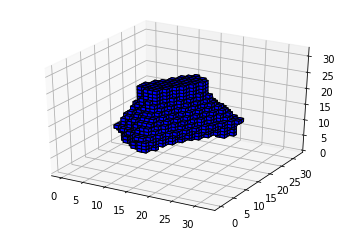

sink


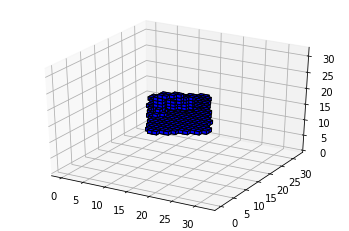

sofa


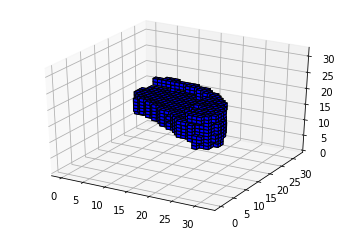

stairs


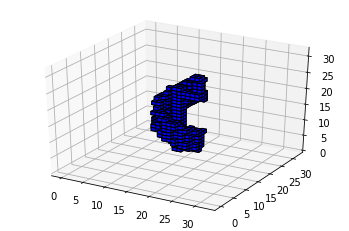

stool


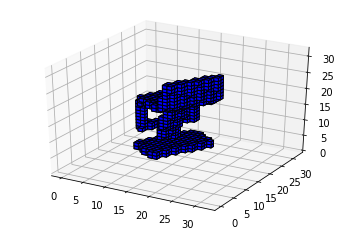

table


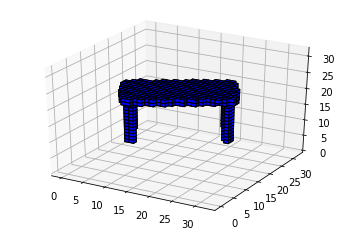

tent


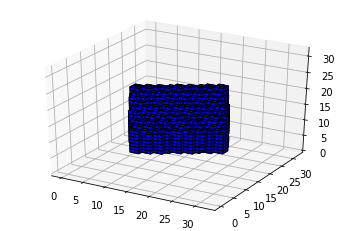

toilet


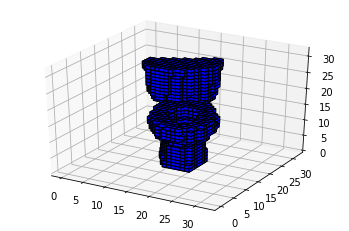

tv_stand


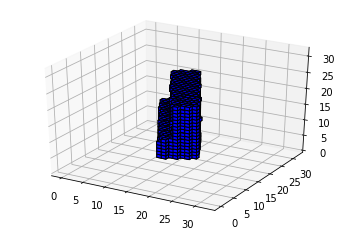

vase


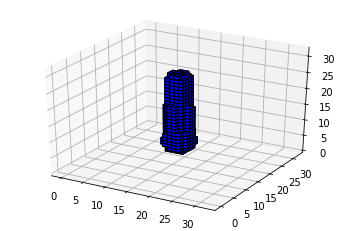

wardrobe


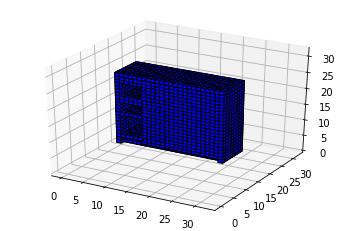

xbox


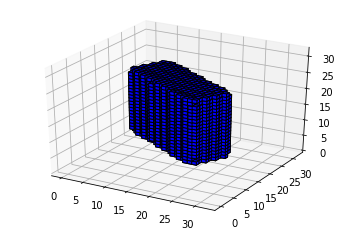

In [42]:
for i, c in enumerate(categories):
    print(c)
    plot_matplotlib(models[i])
    plot_plotly(models[i])

In [41]:
import torch
from glob import glob

for file in glob('/home/p/papstf/workspace/CapsVoxGAN/generated_models/*'):
    var = torch.load(file).cpu()
    arr = var.detach().numpy()
    arr = arr[27,:,:,:,:].squeeze()
    
    plot_matplotlib(arr, 0.9)